# Collage Script for training and visualizations

This is a script to reproduce results for a collage project from the Computational Photography class in spring 2023 at EPFL.

Authors:
* Jakob Lønborg Christensen
* Mathias Micheelsen Lowes
* Bjørn Marius Schreblowski Hansen

Supervisor:

* Martin Nicolas Everaert

A short description is written before each jupyter cell to indicite what it does.

The file `requirements.txt` has the package requirements, and in addition to these you will want to install 2 github packages. One from OpenAI's CLIP:
```
pip install git+https://github.com/openai/CLIP.git
```
And one from my (Author: Jakob Lønborg Christensen) github.
```
pip install git+https://github.com/JakobLC/jlc.git
```
The next cell imports requirements for the main script, but not that more requirements are imported in `collage_functions.py`

We recommend not to run this code in google colab, but to run it locally since accessing files in colab is extremely slow.

In [1]:
%load_ext autoreload
%autoreload 2

import torch
import matplotlib.pyplot as plt
from PIL import Image
import sys

##############################
# PUT YOUR ROOT FOLDER BELOW #
##############################
ROOT = "C:/Users/Jakob/Desktop/DTU/Computational_Photography/"
sys.path.append(ROOT)

from collage_functions import (CollageTransformer,save_model,load_model,
                               validate,train,loss_with_ignore_index,
                               plot_loss_dict,CollageMaker,
                               CollageDataset,custom_collate_with_info)

The next cell creates dataloaders for training. The first 2 lines can be used to select different datasets by commenting out.
Note that we only share 1/4th of the test datasets (2.5% in total or ~10k images) for both dafonts and simulacra, due to storage constraints. We share 10% (1k images) of the LAION 6.5+ aesthetics dataset.

In [2]:
#collage_type_prob = [0.5,0.5,0,0] # Dafonts-free
collage_type_prob = [0,0,1,0] # Simulacra
batch_size = 8
dataset = CollageDataset(collage_sizes = list(range(1,8)),
                        candidate_sizes = [8],
                        positive_candidate_prob = 0.5,
                        collage_type_prob = collage_type_prob,
                        CNN=False)
test_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,collate_fn=custom_collate_with_info)

The next cell initializes a `CollageTransformer` network and puts it onto the GPU.

In [7]:
loss_dict = {"loss_t": [],
             "ite_t": [],
             "acc_t": [],
             "loss_v": [],
             "ite_v": [],
             "acc_v": []} 
assert torch.cuda.is_available()
device = "cuda:0"
model = CollageTransformer(use_embedding_cnn=test_loader.dataset.CNN,
                           freeze_embedding_cnn=False,
                           pretrained_embedding_cnn=True)
_ = model.to(device)
lr = 0.00001
weight_decay = 0.001

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay,betas=(0.9, 0.999))
criterion = loss_with_ignore_index()

The next cell trains a network on the given dataset for 20000 iterations. We do not recommend training since only a small subset of the full dataset is included in this filesharing.

In [ ]:
train(model,loss_dict,
      train_loader=test_loader,
      vali_loader=test_loader,
      criterion=criterion,
      optimizer=optimizer,
      n_iter=20000,
      warmup=0.1)

The cell below saves the network.

In [ ]:
#save_name = "20k_font.pt" # If you use this Dafonts-free model, then remember to also use Dafonts-free as dataset
save_name = "20k_sim.pt" # If you use this Simulacra model, then remember to also use Simulacra as dataset
save_model(save_name,model,optimizer,loss_dict)

The cell below loads a trained network and plots is loss and accuracy plot.

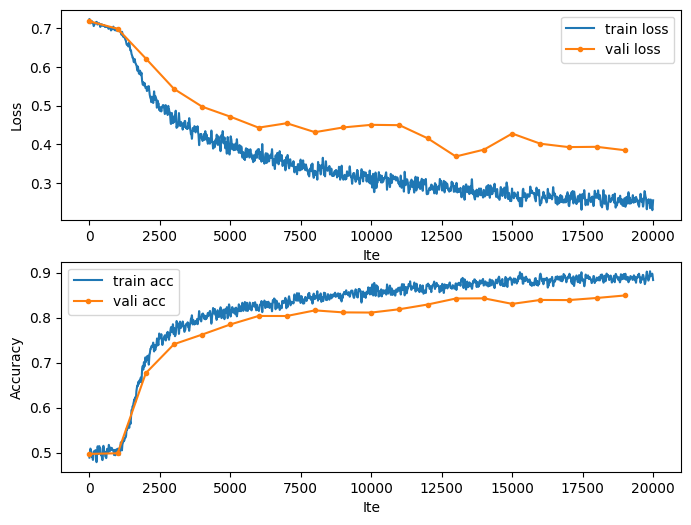

In [8]:
save_name = "20k_sim.pt"
model,optimizer,loss_dict = load_model(save_name,device="cuda:0")
plot_loss_dict(loss_dict)

The cell below calculates loss and accuracy on the different datasets for the trained network. Note the values are not deterministically calculated so it will differ slightly from the report

In [9]:
n_vali_batches = 500
#train_loss,train_acc = validate(model,train_loader,criterion,n_vali_batches=n_vali_batches)
#print(f"Train loss: {train_loss:.3f}  Train acc: {train_acc:.3f}")
#vali_loss,vali_acc = validate(model,vali_loader,criterion,n_vali_batches=n_vali_batches)
#print(f" Vali loss: {vali_loss:.3f}   Vali acc: {vali_acc:.3f}")
test_loss,test_acc = validate(model,test_loader,criterion,n_vali_batches=n_vali_batches)
print(f" Test loss: {test_loss:.3f}   Test acc: {test_acc:.3f}")

 Test loss: 0.472   Test acc: 0.835


The cell below initializes the CollageMaker class, used to grow collages and visualize batches.

In [10]:
CM = CollageMaker(dataset,
                 collage_sizes = [5],
                 candidate_sizes = [5],  
                 batch_size = 8,
                 positive_candidate_prob = 0.5)

Visualize a batch of predictions. Each row on the left is the given collage and each row on the right is the probability predictions on top of the candidate images. Red means ground truth = 0 (not collage) and green means ground truth = 1 (collage).

c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(


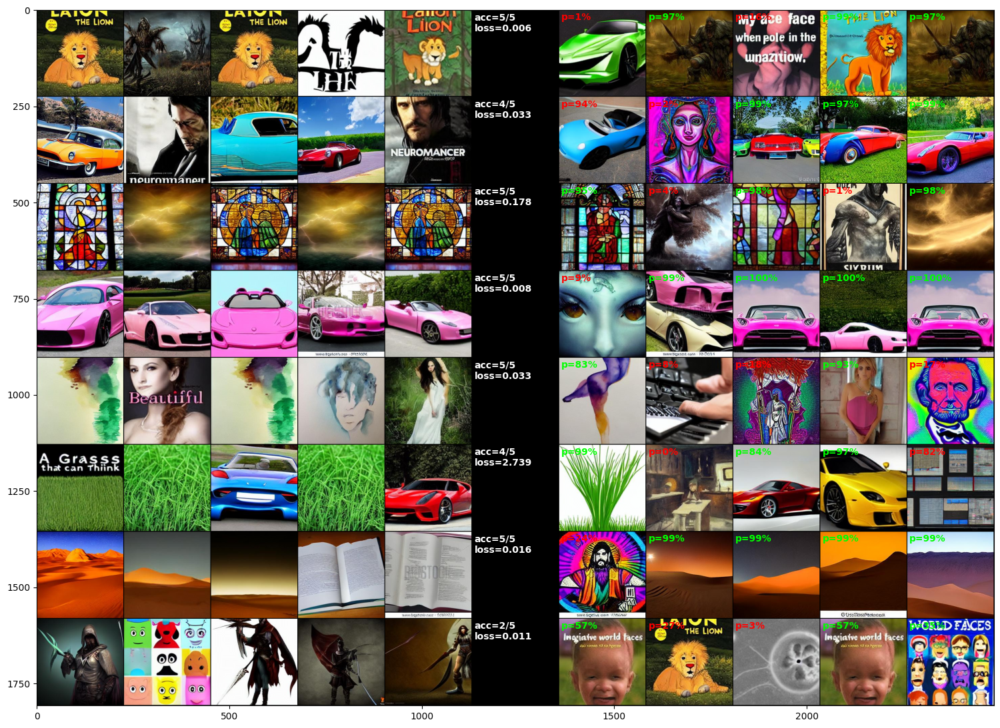

In [18]:
CM.visualize_batch_predictions(model,
                               reshape_size=[224,224])

Show a collage, grown from a random seed image.

 93%|█████████▎| 14/15 [00:02<00:00,  6.60it/s]


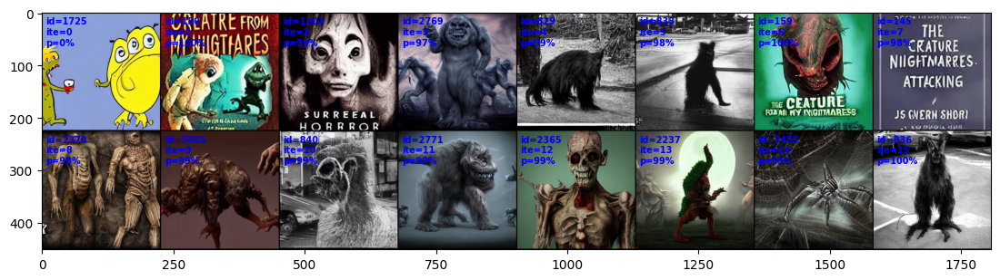

In [19]:
CM.grow_collage(model,
                seed_clip_idx = None,
                stop_size=16,
                clip_text=None,
                num_seeds=1,
                max_candidates_per_ite=128,
                imshow=True,
                show_text=True)

Grow a collage from different text seeds with CLIP. There may be a few duplicates because the shared dataset is quite small.

  0%|          | 0/1 [00:00<?, ?it/s]c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(
  0%|          | 0/1 [00:02<?, ?it/s]


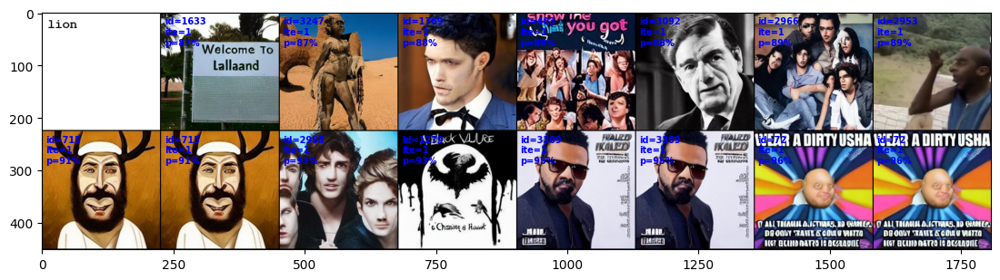

  0%|          | 0/1 [00:00<?, ?it/s]c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(
  0%|          | 0/1 [00:01<?, ?it/s]


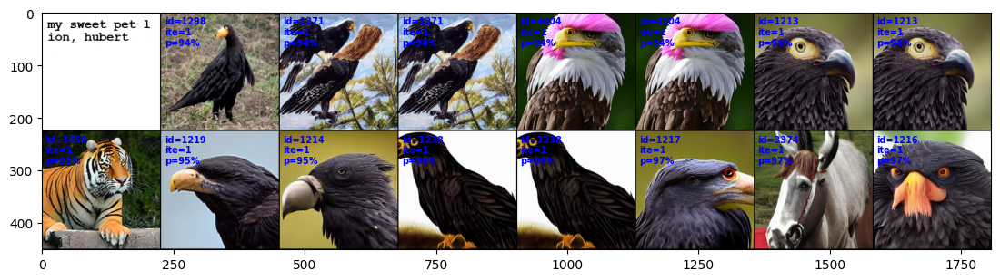

  0%|          | 0/1 [00:00<?, ?it/s]c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(
  0%|          | 0/1 [00:01<?, ?it/s]


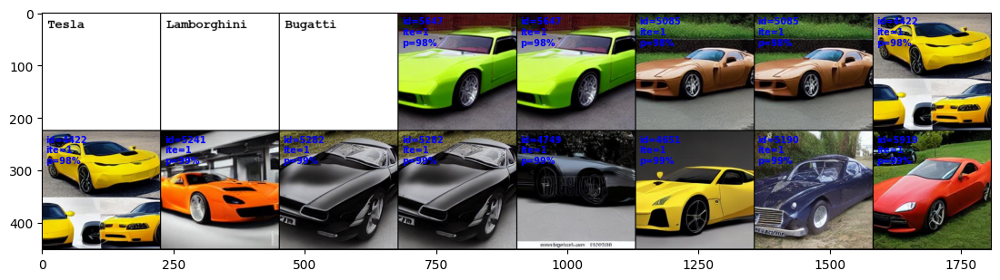

  0%|          | 0/1 [00:00<?, ?it/s]c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(
  0%|          | 0/1 [00:01<?, ?it/s]


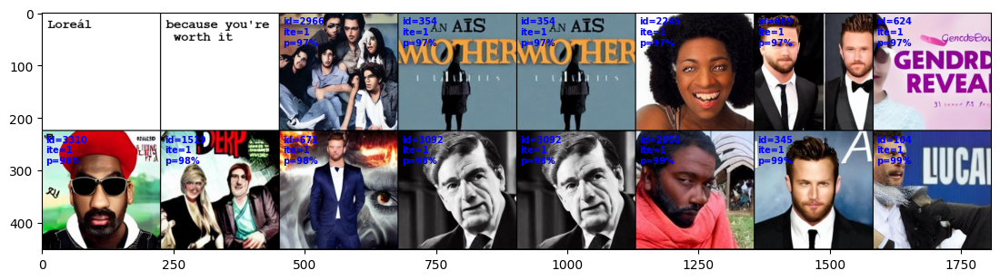

In [20]:
clip_seeds=["lion","my sweet pet lion, hubert",["Tesla","Lamborghini","Bugatti"],["Loreál","because you're worth it"]]
for clip_seed in clip_seeds:
    CM.grow_collage(model,
                    seed_clip_idx = None,
                    stop_size=16,
                    clip_text=clip_seed,
                    grow_per_ite=15,
                    num_seeds=1,
                    max_candidates_per_ite=2048,
                    imshow=True,
                    show_text=True)

Initialize a LAION Aesthetics dataset collagemaker.

In [21]:
dataset_LAION = CollageDataset(collage_type_prob=[0,0,0,1])
CM_LAION = CollageMaker(dataset_LAION,positive_candidate_prob = 0.0)

Grow collage from a random seed.

 93%|█████████▎| 14/15 [00:01<00:00,  7.64it/s]


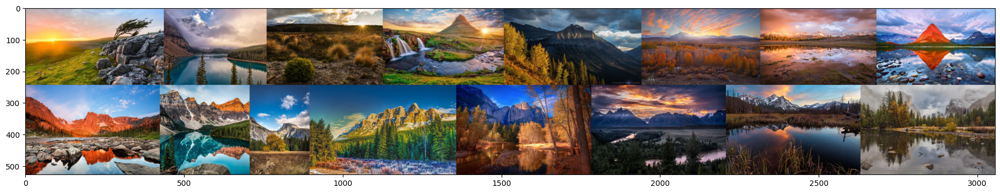

In [23]:
CM_LAION.grow_collage(model,
                seed_clip_idx = None,
                stop_size=16,
                clip_text=None,
                num_seeds=1, #change for more or less random seeds
                max_candidates_per_ite=128, #change for more or less candidates to select 1 image per iteration
                imshow=True,
                fancy_collage=True)

Grow a collage from one or more text embedding seeds. All images are sampled independently if grow_per_ite=15, set it to 1 to do dependent sampling.

  0%|          | 0/1 [00:00<?, ?it/s]c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\transformer.py:562: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._transformer_encoder_layer_fwd(
c:\Users\Jakob\anaconda3\envs\cv-env\lib\site-packages\torch\nn\modules\activation.py:1160: UserWarning: Converting mask without torch.bool dtype to bool; this will negatively affect performance. Prefer to use a boolean mask directly. (Triggered internally at ..\aten\src\ATen\native\transformers\attention.cpp:152.)
  return torch._native_multi_head_attention(
  0%|          | 0/1 [00:01<?, ?it/s]


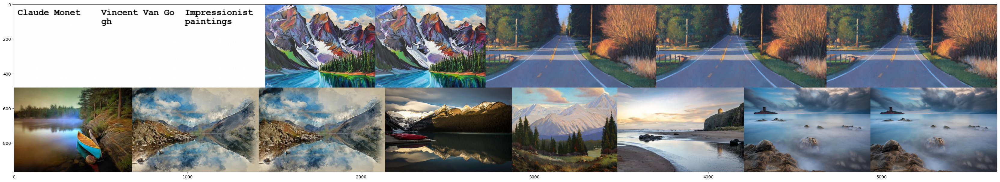

In [24]:
CM_LAION.grow_collage(model,
                stop_size=16,
                clip_text=["Claude Monet","Vincent Van Gogh","Impressionist paintings"],
                max_candidates_per_ite=1024,
                grow_per_ite=15,
                imshow=True,
                fancy_collage=True)

Load an image from a file and use it as a seed for a collage

  0%|          | 0/1 [00:00<?, ?it/s]


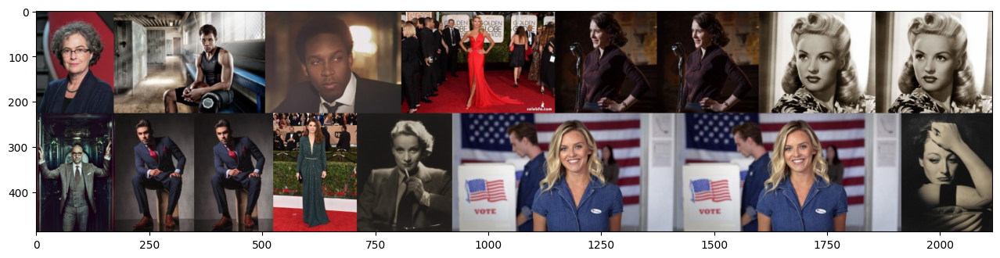

In [25]:
image = Image.open("Sabine-Suesstrunk.jpg")
CM_LAION.grow_collage(model,
                clip_image=image,
                stop_size=16,
                num_seeds=1,
                grow_per_ite=15,
                max_candidates_per_ite=1024,
                reshape_size=(224,224),
                fancy_collage=True)

Grow a collage from specified seed indices.

 93%|█████████▎| 14/15 [00:01<00:00,  7.50it/s]


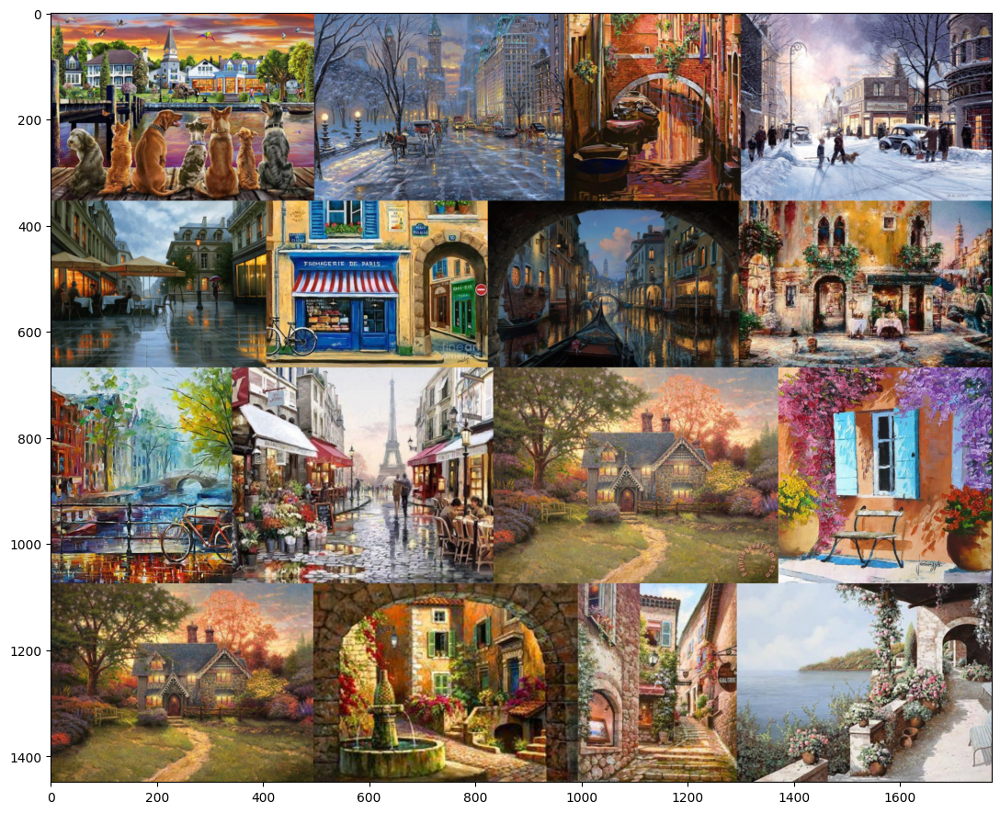

In [28]:
CM_LAION.grow_collage(model,
                seed_clip_idx = [11], #set some specific indices seed here as long as the number is less than len(dataset)
                stop_size=16,
                clip_text=None,
                num_seeds=1,
                max_candidates_per_ite=128,
                imshow=True,
                n_fancy_rows=4,
                fancy_collage=True)